### Import

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [10]:
from skimage import img_as_ubyte
from skimage.color import rgb2gray, rgb2hsv, label2rgb
from skimage.exposure import equalize_hist, rescale_intensity, adjust_sigmoid, adjust_log, histogram, is_low_contrast, match_histograms
from skimage.filters import threshold_otsu, rank, median, unsharp_mask, gaussian
from skimage.feature import canny
from skimage.segmentation import clear_border
from skimage.morphology import dilation, erosion, closing, opening, binary_closing, binary_opening, convex_hull_image, disk, square, diamond, thin
from scipy.ndimage import binary_fill_holes, binary_erosion, binary_dilation
from skimage.util import invert
from skimage.measure import label, regionprops

from skimage.restoration import denoise_bilateral
from skimage.morphology import remove_small_objects, remove_small_holes, diameter_closing, area_closing, star, octagon
import cv2
import imutils

from skimage.draw import ellipse
from skimage.measure import find_contours, approximate_polygon

In [11]:
def list_get(list_, ind_, default_):
  try:
    return list_[ind_]
  except IndexError:
    return default_

In [12]:
def show_images(img_arr, name_arr=[], n_in_row=3, factor_r=4, factor_c=4, figsize=None,
         title=None, cmap_='Greys', label_fontsize=12, tick_fontsize=11, save_path=None):
    if type(img_arr) is np.ndarray:
        quant = img_arr.shape[0]
    elif type(img_arr) is list:
        quant = len(img_arr)
    cols = min(quant, n_in_row)
    rows = quant // n_in_row + (1 if quant % n_in_row else 0)
    if figsize is None:
        figsize = (int(factor_c * cols), int(factor_r * rows))
    fig = plt.figure(figsize=figsize)
    if title is not None:
        fig.suptitle(title, fontsize=14, y = 0.88)
    for i, img in enumerate(img_arr):
        ax = fig.add_subplot(rows, cols, i + 1)
        if type(img) is tuple:
            x, y = img
            ax.plot(x, y)
            ax.set_xlabel(list_get(name_arr, i, ''), fontsize=label_fontsize)
        else:
            ax.imshow(img, cmap=cmap_)
            ax.set_xlabel(list_get(name_arr, i, ''), fontsize=label_fontsize)
            ax.xaxis.set_ticks_position('top')
            ax.tick_params(axis='both', labelsize=tick_fontsize)
    plt.tight_layout()
    if save_path is not None:
        plt.savefig(f'{save_path}')
    plt.show()

In [13]:
def show_image(img, name='', factor_r=4, factor_c=4, figsize=None, n_in_row=3,
         title=None, cmap_='Greys', label_fontsize=12, tick_fontsize=11, save_path=None):
    if figsize is None:
        figsize = (int(factor_c), int(factor_r))
    fig = plt.figure(figsize=figsize)
    fig = plt.figure(figsize=(factor_c, factor_r))
    if title is not None:
        fig.suptitle(title, fontsize=14, y = 0.88)
    plt.imshow(img, cmap=cmap_)
    plt.xlabel(name, fontsize=label_fontsize)
    plt.gca().xaxis.set_ticks_position('top')
    plt.tick_params(axis='both', labelsize=tick_fontsize)
    plt.tight_layout()
    if save_path is not None:
        plt.savefig(f'{save_path}')
    return plt

In [14]:
def to_1ch(img, mode='gray'):
    transf_1ch = (
        {'r': lambda img: img[:, :, 0],
         'g': lambda img: img[:, :, 1],
         'b': lambda img: img[:, :, 2],
         'h': lambda img: img_as_ubyte(rgb2hsv(img)[:, :, 0]),
         's': lambda img: img_as_ubyte(rgb2hsv(img)[:, :, 1]),
         'v': lambda img: img_as_ubyte(rgb2hsv(img)[:, :, 2]),
         'gray': lambda img: img_as_ubyte(rgb2gray(img))}
    )
    return transf_1ch[mode](img)

In [15]:
def to_bin(img, thr='otsu'):
    if thr == 'otsu':
        return img > threshold_otsu(img)
    else:
        return img > 255 * thr

### Решение

In [16]:
src_images = []
src_names = []
for i in [1, 2, 4, 6, 7, 9, 10, 11]:
    name = f'IMG_{i}'
    src_images.append(np.array(Image.open(f'input/{name}.jpg')))
    src_names.append(name)

In [17]:
def bg_filter(img, thr_a=0, thr_b=255, print_=False, factor=0.4):
    y, x = histogram(img)
    x, y = np.array(x), np.array(y)
    x, y = x[thr_a:thr_b+1], y[thr_a:thr_b+1]

    y_mean = np.mean(y)
    y_med = np.median(y)
    thr = y_med + np.abs(y_mean - y_med) * factor

    i0 = np.argmax(y)  
    i1, i2 = i0, i0
    i_min, i_max = 0, thr_b - thr_a

    for i in range(i0, i_min - 1, -1):
        if not (y[i] > thr):
            i1 = i
            break
        
    for i in range(i0, i_max + 1):
        if not (y[i] > thr):
            i2 = i
            break
            
    x1, x2 = x[i1], x[i2]
    

    if print_:
        y_mean_arr = np.full_like(y, y_mean)
        y_med_arr = np.full_like(y, y_med)
        thr_arr = np.full_like(y, thr)
        fig = plt.figure(figsize=(10, 6))
        plt.plot(x, y, label='y, histogram')
        plt.plot(x, y_mean_arr, label='y mean')
        plt.plot(x, y_med_arr, label='y median')
        plt.plot(x, thr_arr, label='threshold')
        plt.plot(x1, y[i1], 'bo', label='left bound')
        plt.plot(x2, y[i2], 'ro', label='right bound')
        plt.legend()
        plt.show()

    img = (img >= x1) & (img <= x2)
    img = binary_fill_holes(img, disk(1))
    return img

def mask_objects_3(img, sigmoid_thr=0.5, canny_sigma=0.5, closing_r=5, opening_r=15, erosion_r=3):
    img = to_1ch(img, mode='s')
#     img = adjust_sigmoid(img, cutoff=sigmoid_thr)
    img = canny(img, sigma=canny_sigma)
    img = binary_closing(img, disk(closing_r))
    img = binary_fill_holes(img, disk(1))
    img = binary_opening(img, disk(opening_r))
    img = binary_erosion(img, disk(erosion_r))
    return img

def mask_objects(img):
    bg_1 = bg_filter(to_1ch(img, 'h'))
    mask_1 = mask_objects_3(img) * bg_1
    t_ = to_1ch(img, 'h') * mask_1
    bg_2 = bg_filter(t_, thr_a = 15, factor=0.5)
    mask_2 = to_bin(t_)
    res = bg_2 * mask_2
    return res

In [18]:
# def solve(img):
#     mask = mask_objects(img)
#     img = to_1ch(img, mode='s')
#     res_1 = img / gaussian(img, sigma=2.5)
#     h_ = equalize_hist(res_1)
#     res_2 = gaussian(unsharp_mask(gaussian(h_, sigma=1.0), radius=25, amount=3), sigma=1.0)
#     res_3 = invert(to_bin(res_2))
#     d_ = res_3 * binary_erosion(binary_closing(mask, disk(1)), disk(4))

#     s_ = binary_fill_holes(binary_closing(d_, square(2)), disk(1))
#     a_ = remove_small_objects(s_, 1200, connectivity=2)
#     a_ = binary_fill_holes(binary_closing(a_, square(3)), disk(1))
#     a_ = binary_opening(a_, square(3))
#     a_ = remove_small_objects(a_, 1200, connectivity=2)
#     a_ = binary_fill_holes(binary_closing(a_, square(4)), disk(1))
#     b_ = a_

#     mask_ = binary_opening(a_, diamond(5))
#     mask_ = remove_small_objects(mask_, 1100, connectivity=2)
#     mask_ = binary_dilation(mask_, square(15))

#     a_ = a_ * mask_
# #     a_ = binary_opening(a_, disk(1))
# #     a_ = binary_erosion(a_, square(1))
#     return a_



# def approx_poly(img):
#     img = solve(img)
#     img = binary_erosion(img, star(2))
#     img = invert(unsharp_mask(img, radius=5, amount=3))

#     fig = plt.figure(figsize=(10, 8))
#     plt.imshow(img)

#     # approximate / simplify coordinates of the two ellipses
#     for i, contour in enumerate(find_contours(img, 0.2)):
#         coords = approximate_polygon(contour, tolerance=6)
#         colors = ['red', 'blue', 'green', 'yellow', 'cyan', 'magenta', 'pink',
#                   'red', 'blue', 'green', 'yellow', 'cyan', 'magenta', 'pink',
#                   'red', 'blue', 'green', 'yellow', 'cyan', 'magenta', 'pink',
#                   'red', 'blue', 'green', 'yellow', 'cyan', 'magenta', 'pink']
#         plt.plot(coords[:, 1], coords[:, 0], color=colors[i], linewidth=2)
#         text_coords = coords.mean(axis=0)[::-1]
#     #     print(text_coords)
#         n = len(coords) - 1
#         plt.text(*text_coords, n, dict(color='white', va='center', ha='center'))
#     #     coords2 = approximate_polygon(contour, tolerance=39.5)
#     #     plt.plot(coords2[:, 1], coords2[:, 0], '-g', linewidth=2)
#     #     print("Number of coordinates:", colors[i], len(contour), len(coords), len(coords2))

#     plt.show()

In [19]:
def approx_poly(img, name='image', tol=None):
    img_read = img.copy()
    img_read = cv2.cvtColor(img_read, cv2.COLOR_BGR2RGB)
    bin_ = solve(img)
    bin_ = (np.where(bin_ == True, 255, 0)).astype(np.uint8)
#     cv2.imshow(f'Bin {name}', bin_)
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()
    imagecontours, _ = cv2.findContours(bin_, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)    
    for count in imagecontours:
        epsilon = tol * cv2.arcLength(count, True)
        approximations = cv2.approxPolyDP(count, epsilon, True)
        cv2.drawContours(img_read, [approximations], 0, (255, 0, 0), 2)
        i, j = approximations[0][0]
        conv_text = 'C' if cv2.isContourConvex(approximations) else ''
        cv2.putText(img_read, f'{len(approximations)}{conv_text}', (i, j), cv2.FONT_HERSHEY_COMPLEX, 1, (255,255,255), 2)
    cv2.imshow(f'Result {name}', img_read)
    cv2.waitKey(0)
    cv2.destroyAllWindows()


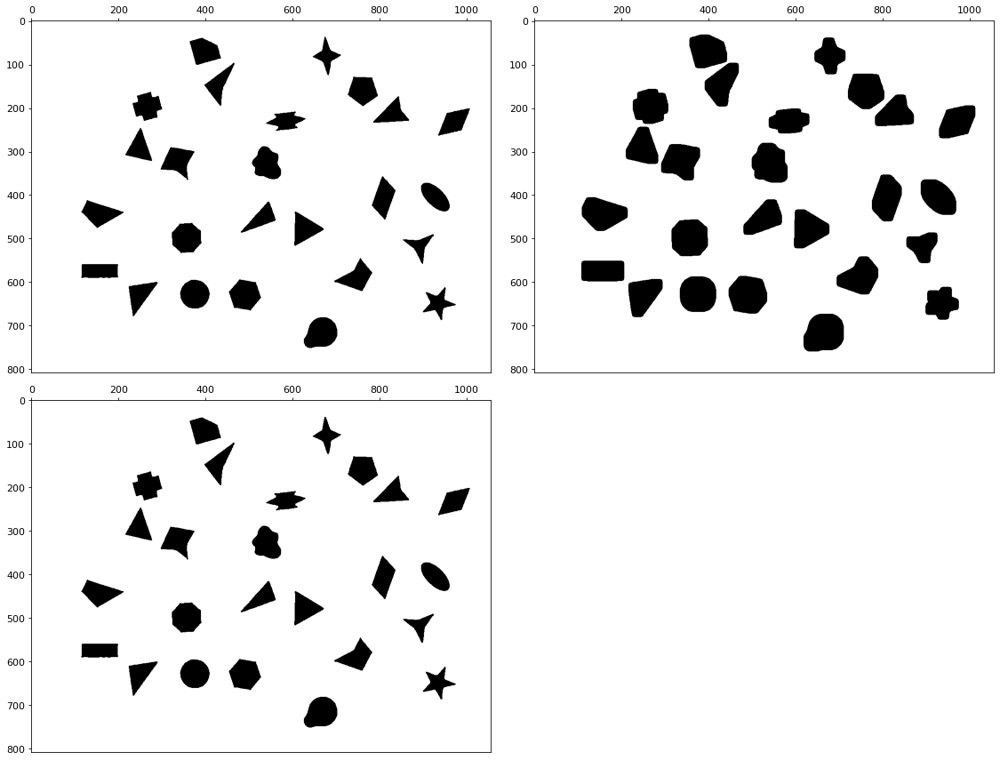

In [50]:
def solve(img):
    mask = mask_objects(img)
    img = to_1ch(img, mode='s')

    res_1 = img / gaussian(img, sigma=1.75)
    h_ = equalize_hist(res_1)
    res_2 = gaussian(unsharp_mask(gaussian(h_, sigma=1.0), radius=25, amount=3), sigma=1.0)
    k_ = invert(to_bin(res_2))
    res_3 = k_
    d_ = res_3 * binary_erosion(binary_closing(mask, disk(1)), disk(4))
    s_ = binary_fill_holes(binary_closing(d_, square(2)), disk(1))
    a_ = remove_small_objects(s_, 1200, connectivity=2)
    a_ = binary_fill_holes(binary_closing(a_, square(3)), disk(1))
    a_ = remove_small_objects(a_, 1000, connectivity=2)
    a_ = binary_opening(a_, disk(1))
    a_ = remove_small_objects(a_, 1000, connectivity=2)
    a_ = binary_closing(a_, square(5))
    a_ = remove_small_objects(a_, 1000, connectivity=2)
#     a_ = binary_closing(a_, disk(1))
    a_ = binary_fill_holes(binary_closing(a_, square(4)), disk(1))
    
    mask_ = thin(a_, 3)
    mask_ = binary_opening(a_, disk(5))
#     mask_ = binary_opening(a_, diamond(4))
    mask_ = remove_small_objects(mask_, 500, connectivity=2)
#     mask_ = remove_small_objects(mask_, 1000, connectivity=2)
    mask_ = binary_dilation(mask_, square(17))

    b_ = mask_ * a_
#     show_images([b_], n_in_row=1, factor_r=6, factor_c=8)
    show_images([a_, mask_, b_], n_in_row=2, factor_r=6, factor_c=8)
    
    return b_

def approx_poly(img, name='image', colored_res=True):
    img_read = img.copy()
    img_read = cv2.cvtColor(img_read, cv2.COLOR_BGR2RGB)
    bin_ = solve(img)
    bin_ = bin_.astype(np.uint8) * 255
#     cv2.imshow(f'Bin {name}', bin_)
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()
    approx_arr = []
    b_ = bin_
    quant = [0, 0, 0]
    tol = [0.017, 0.012, 0.02]
    
#=====1=====    
    a_ = b_
    a_ = binary_closing(a_, disk(2))
    a_ = thin(a_, 2)
    a_ = unsharp_mask(a_, radius=3, amount=4)
    a_ = a_.astype(np.uint8) * 255

    imagecontours, _ = cv2.findContours(a_, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    
    for i, count in enumerate(imagecontours):
        epsilon= tol[0] * cv2.arcLength(count, True)
        approx = cv2.approxPolyDP(count, epsilon, True)
        if len(approx) <= 6:
            approx_arr.append(approx)
            quant[0] += 1
            
            mask = np.zeros_like(b_, np.uint8)
            cv2.drawContours(mask, imagecontours, i, color=255, thickness=cv2.FILLED)
            mask = invert(cv2.dilate(mask, disk(5)))
            b_ = cv2.bitwise_and(b_, mask)
            
#=====2=====    
    a_ = b_
    a_ = thin(a_, 2)
#     a_ = unsharp_mask(a_, radius=3, amount=4)
    a_ = a_.astype(np.uint8) * 255

    imagecontours, _ = cv2.findContours(a_, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    
    for i, count in enumerate(imagecontours):
        epsilon= tol[1] * cv2.arcLength(count, True)
        approx = cv2.approxPolyDP(count, epsilon, True)
        if len(approx) == 8:
            approx_arr.append(approx)
            quant[1] += 1
            
            mask = np.zeros_like(b_, np.uint8)
            cv2.drawContours(mask, imagecontours, i, color=255, thickness=cv2.FILLED)
            mask = invert(cv2.dilate(mask, disk(5)))
            b_ = cv2.bitwise_and(b_, mask)
            
#=====3=====
    a_ = b_
    a_ = unsharp_mask(a_, radius=3, amount=4)
    a_ = a_.astype(np.uint8) * 255

    imagecontours, _ = cv2.findContours(a_, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    
    for i, count in enumerate(imagecontours):
        epsilon= tol[2] * cv2.arcLength(count, True)
        approx = cv2.approxPolyDP(count, epsilon, True)
        if len(approx) > 8:
            approx_arr.append(approx)
            quant[2] += 1
            
            mask = np.zeros_like(b_, np.uint8)
            cv2.drawContours(mask, imagecontours, i, color=255, thickness=cv2.FILLED)
            mask = invert(cv2.dilate(mask, disk(5)))
            b_ = cv2.bitwise_and(b_, mask)
            
#=====4=====
    a_ = b_

    imagecontours, _ = cv2.findContours(a_, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    for count in imagecontours:
#         cv2.drawContours(img_read, [count], 0, (255, 255, 0), cv2.FILLED)
        cv2.drawContours(img_read, [count], 0, (0, 0, 255), 2)
    
    s = 0
    for i, q in enumerate(quant):
        for j, approx in enumerate(approx_arr[s:s+q]):
            if colored_res:
                if i == 0:
                    cv2.drawContours(img_read, [approx], 0, (0, 0, 255), cv2.FILLED)
                elif i == 1:
                    cv2.drawContours(img_read, [approx], 0, (0, 255, 0), cv2.FILLED)
                elif i == 2:
                    cv2.drawContours(img_read, [approx], 0, (0, 255, 255), cv2.FILLED)

            cv2.drawContours(img_read, [approx], 0, (0, 0, 255), 2)
            poly_text = 'P'
            conv_text = 'C' if cv2.isContourConvex(approx) else ''
            cv2.putText(img_read, f'{poly_text}{len(approx)}{conv_text}', approx[0][0],
                        cv2.FONT_HERSHEY_COMPLEX, 1, (255,255,255), 2)
        s += q

    cv2.imshow(f'Result {name}', img_read)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    
#     cv2.imshow(f'Bin 2{name}', b_)
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()

for i in [2]:
#     solve(src_images[i])
    approx_poly(src_images[i], src_names[i])
    # 2 4 7 3

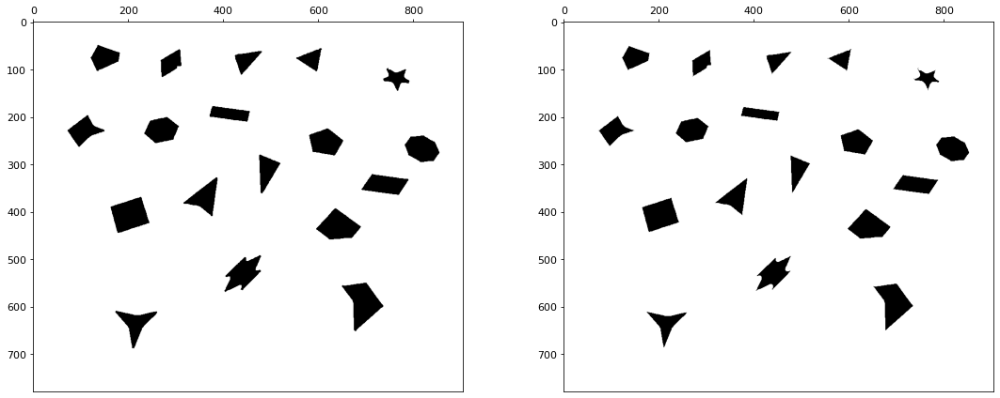

In [947]:
bin_ = solve(src_images[6])
show_images([bin_, thin(bin_, 2)], factor_r=6, factor_c=8)

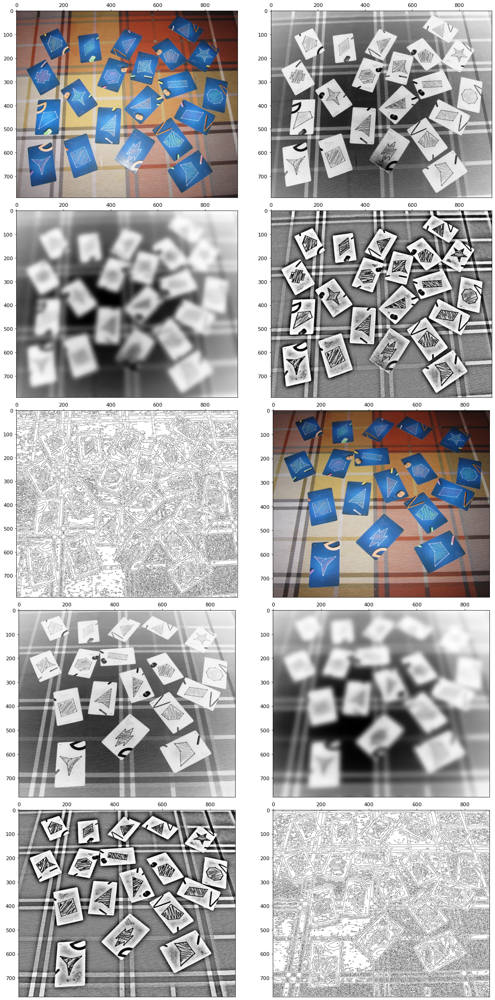

In [190]:
ans = []
for i, j in zip([1, 2, 4, 6, 7, 9, 10], [5, 6]):
    img = src_images[j]
    res = mask_objects(img)
    r_ = to_1ch(img, mode='r')
    r_i = gaussian(r_, sigma=10)
    div_ = r_ / r_i
    ok_ = equalize_hist(div_)
    ok_2 = canny(ok_)
#     v_ = to_1ch(img, mode='s')
#     r_2 = r_ * binary_erosion(res, disk(3))
#     print(r_2)
#     g_ = rescale_intensity(r_, in_range=(0, 195))
#     t_ = canny(g_, sigma=1.95)
#     t_2 = canny(g_)
#     b_1 = t_ * binary_erosion(res, disk(3))
#     b_2 = binary_fill_holes(binary_closing(b_1, disk(5)), disk(1))
#     b_2 = binary_opening(b_2, square(5))
#     ans += [g_, t_, b_1, b_2, unsharp_mask(b_2, radius=20, amount=3)]
    ans += [img, r_, r_i, ok_, ok_2]#, g_, t_, t_2, b_2]
    
show_images(ans, n_in_row=2, factor_r=6, factor_c=8)

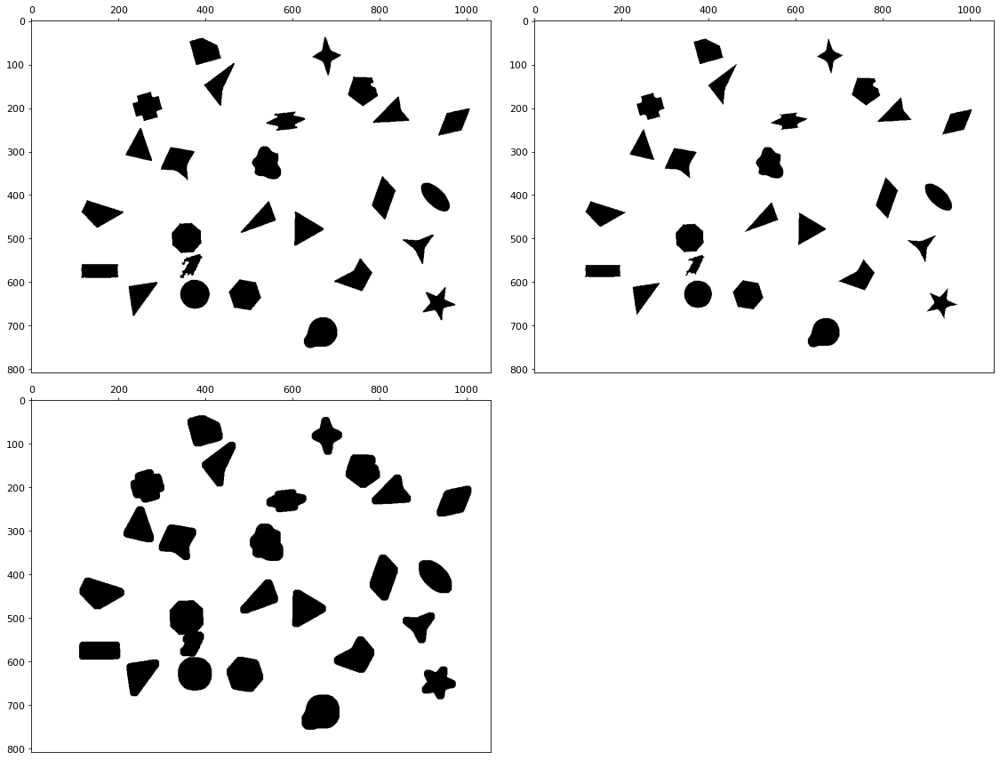

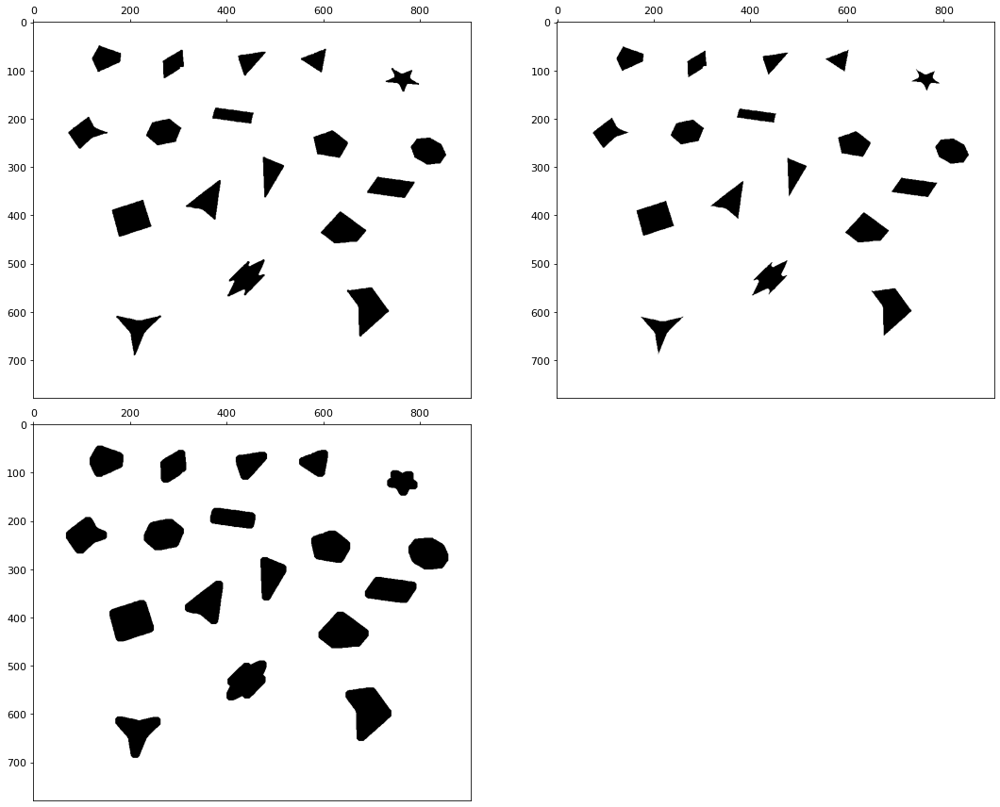

<Figure size 0x0 with 0 Axes>

In [228]:
def del_obj_betw(img, a, b):
    a, b = min(a, b), max(a, b)
    fig_gt_a = remove_small_objects(img, a, connectivity=2)
    fig_gt_b = remove_small_objects(img, b, connectivity=2)
    fig_a_to_b = fig_gt_a ^ fig_gt_b
    return img ^ fig_a_to_b
    

arr_ = []
for i in [2, 6]:
    img = src_images[i]
    mask = mask_objects(img)
    img = to_1ch(img, mode='s')
    sigma_arr = [1]#[1, 1.5, 2, 3, 4, 5, 20] #6, 7, 8, 9, 10, 11, 12, 15, 20, 25, 30, 35, 40, 45, 50, 55]
    for s in sigma_arr:
        img_ = img # denoise_bilateral(img)
        res_1 = img_ / gaussian(img_, sigma=2.5)
        h_ = equalize_hist(res_1)
#         show_images([h_, invert(to_bin(h_))])
        res_2 = gaussian(unsharp_mask(gaussian(h_, sigma=1.0), radius=20, amount=3), sigma=1.2)
#         res_3 = my_eq(res_1)
#         res_3 = canny(res_2, sigma=2) * binary_erosion(mask, disk(3))
        k_ = invert(to_bin(res_2))
#         show_image(remove_small_holes(k_))
#         res_3 = binary_closing(k_, disk(1))
        res_3 = k_
        d_ = res_3 * binary_erosion(binary_closing(mask, disk(1)), disk(4))

        s_ = binary_fill_holes(binary_closing(d_, square(2)), disk(1))
#         s_ = binary_fill_holes(binary_closing(s_, star(1)), disk(1))
#         s_ = s_ = binary_fill_holes(binary_closing(s_, square(2)), disk(1))
#         a_ = binary_opening(s_, square(3))
        a_ = remove_small_objects(s_, 1200, connectivity=2)
        a_ = binary_fill_holes(binary_closing(a_, square(3)), disk(1))
        a_ = binary_opening(a_, square(3))
        a_ = remove_small_objects(a_, 1200, connectivity=2)
        a_ = binary_fill_holes(binary_closing(a_, square(4)), disk(1))
        b_ = a_
        
        mask_ = binary_opening(a_, diamond(4))
        mask_ = remove_small_objects(mask_, 1100, connectivity=2)
#         mask_ = gaussian(a_)
#         mask_ = binary_erosion(mask_, disk(1))
        mask_ = binary_dilation(mask_, square(11))
        
        a_ = a_ * mask_
#         a_ = gaussian(a_)
        a_ = binary_erosion(a_, disk(2))
#         a_ = binary_opening(a_, diamond(1))
        
#         a_ = binary_closing(a_, diamond(3))
        
#         a_ = binary_fill_holes(binary_closing(a_, square(4)), disk(1))
#         a_ = binary_opening(a_, diamond(2))
#         a_ = remove_small_objects(a_, 1200, connectivity=2)
#         a_ = del_obj_betw(a_, 100, 1200)
#         a_ = binary_opening(a_, square(3))
#         a_ = del_obj_betw(a_, 100, 1200)
#         a_ = binary_fill_holes(binary_closing(a_, disk(2)), disk(1))
#         b_ = canny(a_)
#         c_ = binary_fill_holes(binary_closing(b_, disk(1)), disk(1))
# #         
        show_images([b_, a_, mask_], n_in_row=2, factor_r=6, factor_c=8)
    
#     res_2, res_3, d_, 
#         mask = binary_erosion(binary_closing(mask, disk(1)), disk(2))
        
        
#         res_4 =  binary_closing(res_3 * mask, disk(1))
#         blb_1 = remove_small_objects(res_4)
#         blb_2 = binary_fill_holes(binary_closing(blb_1, disk(1)), disk(1))
# #         res_4 = binary_closing(res_3 * mask, square(2))
# #         res_5 = binary_fill_holes(res_4, disk(1))
# # #         show_image(binary_opening(mask, disk(3)))
# #         res_6 = res_5 # binary_opening(res_5, disk(3))
# # #         res_7 = unsharp_mask(res_6, radius=4, amount=4)
#         arr_ += [img_, res_2, res_3, res_4, blb_1, blb_2]#, res_4, res_5, res_6]
    
# 
        # , 

# names = []
# for s in sigma_arr:
#     for i in [2, 6]:
#         names.append({0: f'{s}', 1: f'eq {s}', 2: f'2 {s}', 3: f'3 {s}', 4: f'4 {s}'}[i])

show_images(arr_, names, n_in_row=2, factor_r=6, factor_c=8)

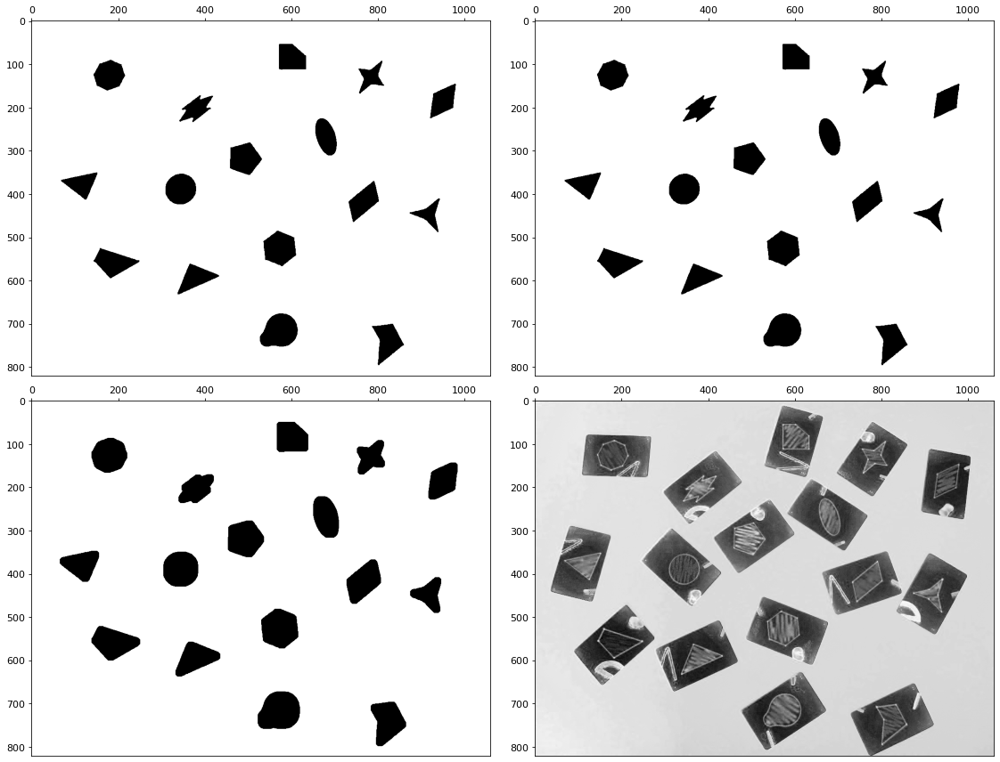

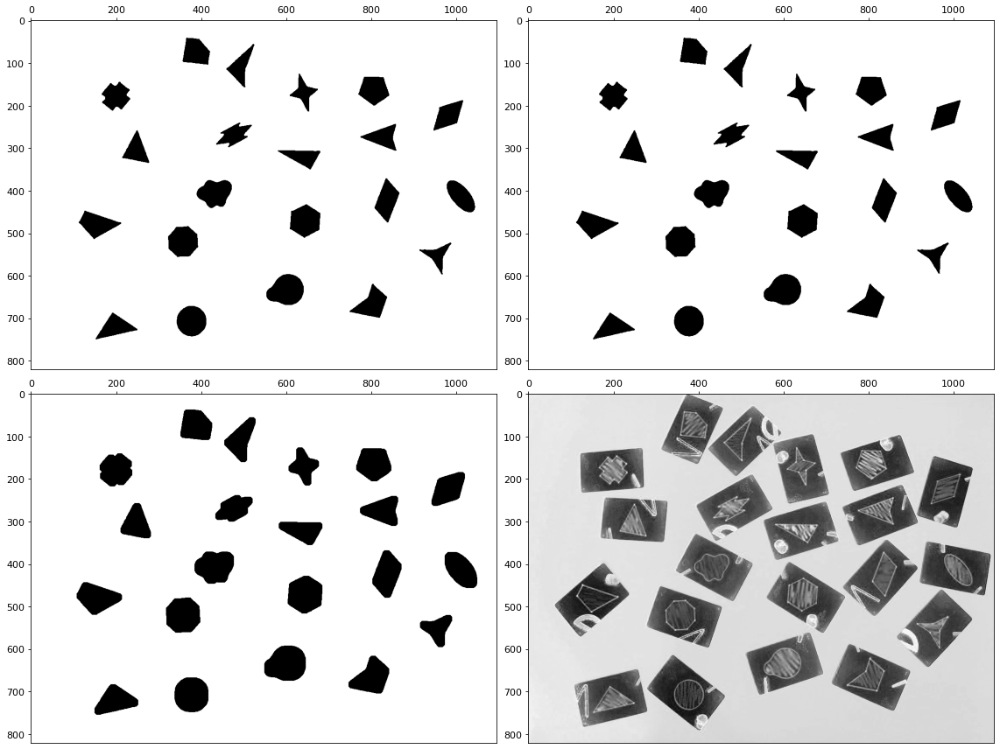

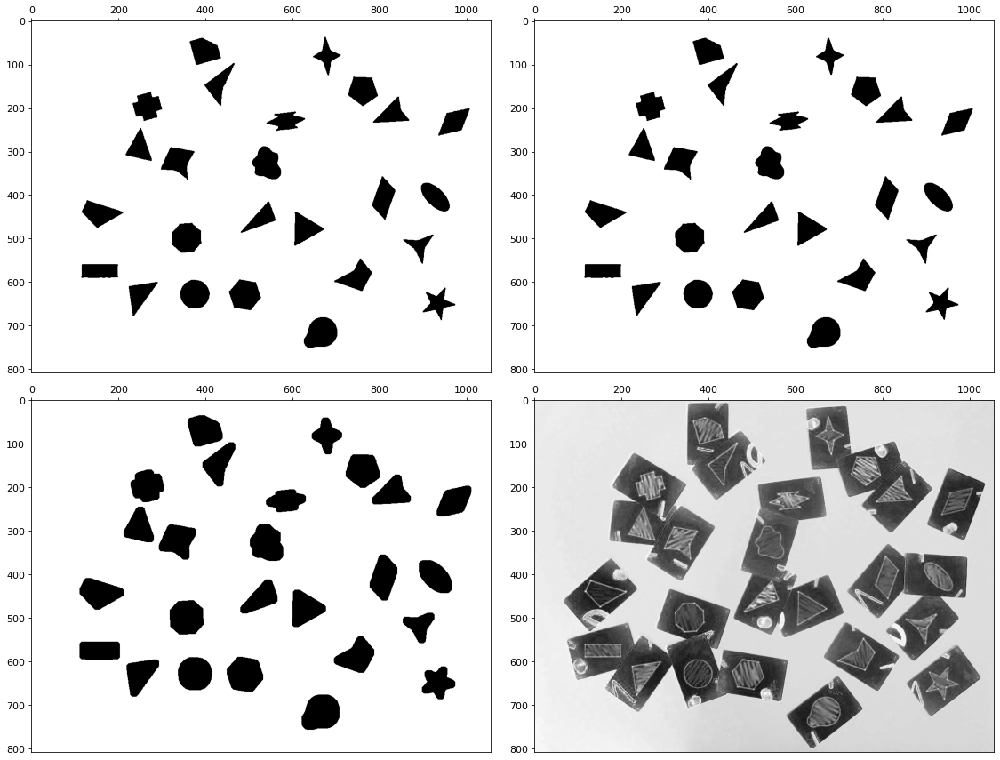

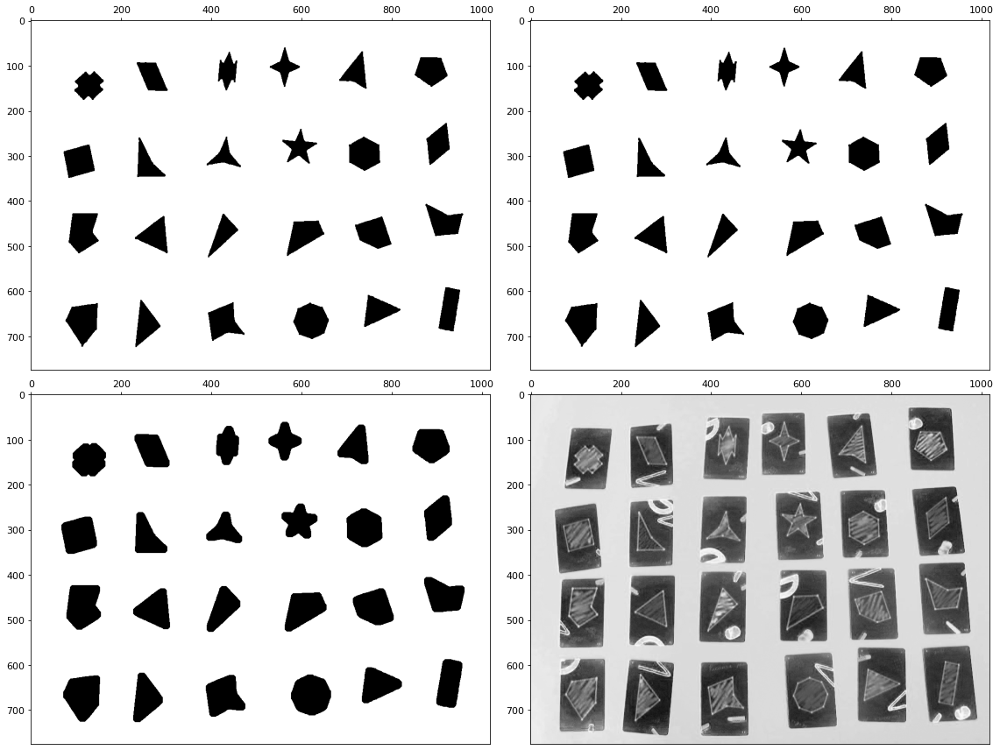

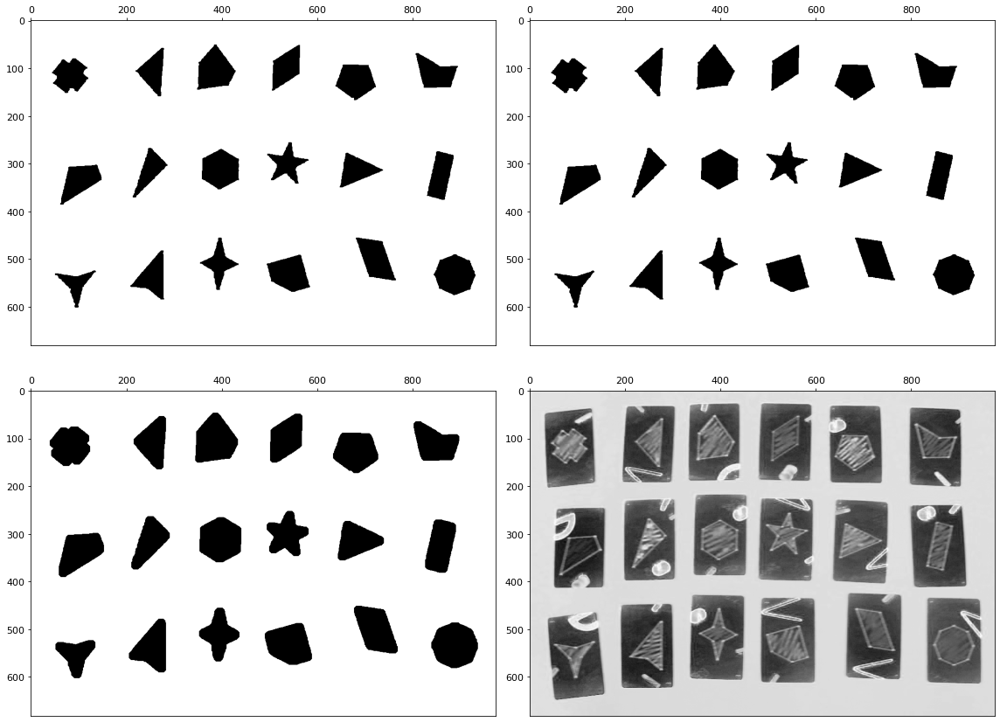

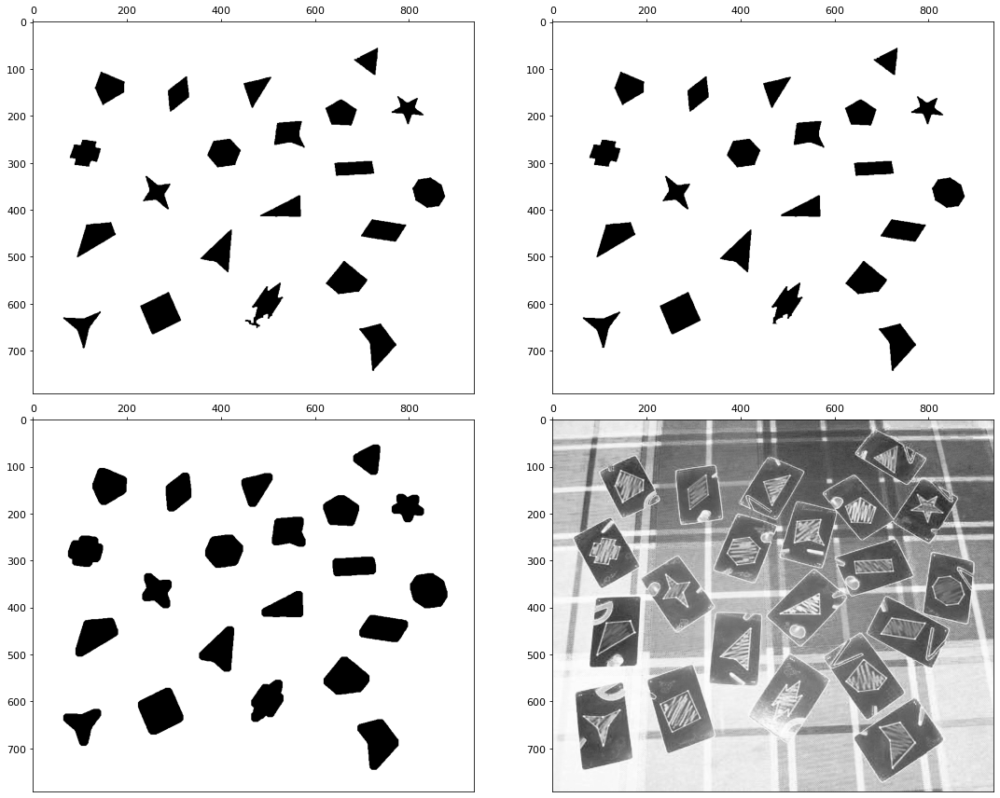

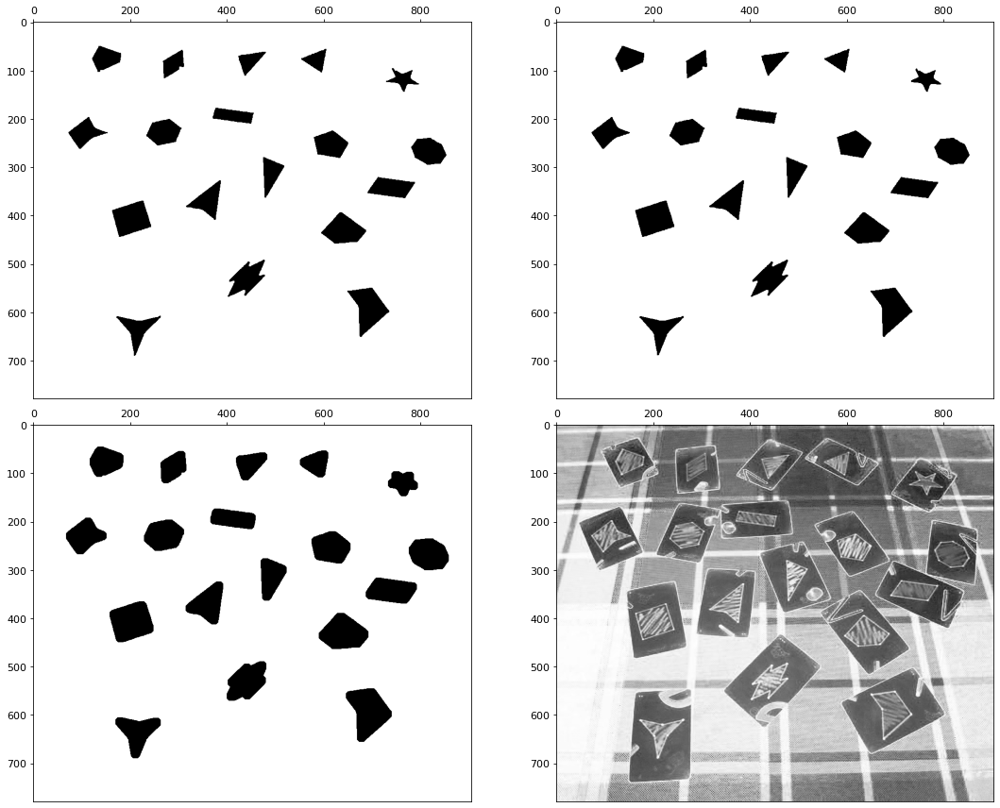

<Figure size 0x0 with 0 Axes>

In [251]:
def del_obj_betw(img, a, b):
    a, b = min(a, b), max(a, b)
    fig_gt_a = remove_small_objects(img, a, connectivity=2)
    fig_gt_b = remove_small_objects(img, b, connectivity=2)
    fig_a_to_b = fig_gt_a ^ fig_gt_b
    return img ^ fig_a_to_b
    

arr_ = []
for i in range(7):
    img = src_images[i]
    mask = mask_objects(img)
    img = to_1ch(img, mode='s')
    sigma_arr = [1]#[1, 1.5, 2, 3, 4, 5, 20] #6, 7, 8, 9, 10, 11, 12, 15, 20, 25, 30, 35, 40, 45, 50, 55]
    for s in sigma_arr:
        img_ = img # denoise_bilateral(img)
        res_1 = img_ / gaussian(img_, sigma=1.75)
        h_ = equalize_hist(res_1)
#         show_images([h_, invert(to_bin(h_))])
        res_2 = gaussian(unsharp_mask(gaussian(h_, sigma=1.0), radius=25, amount=3), sigma=1.0)
#         res_3 = my_eq(res_1)
#         res_3 = canny(res_2, sigma=2) * binary_erosion(mask, disk(3))
        k_ = invert(to_bin(res_2))
#         show_image(remove_small_holes(k_))
#         res_3 = binary_closing(k_, disk(1))
        res_3 = k_
        d_ = res_3 * binary_erosion(binary_closing(mask, disk(1)), disk(4))

        s_ = binary_fill_holes(binary_closing(d_, square(2)), disk(1))
#         s_ = binary_fill_holes(binary_closing(s_, star(1)), disk(1))
#         s_ = s_ = binary_fill_holes(binary_closing(s_, square(2)), disk(1))
#         a_ = binary_opening(s_, square(3))
        a_ = remove_small_objects(s_, 1200, connectivity=2)
        a_ = binary_fill_holes(binary_closing(a_, square(3)), disk(1))
        a_ = binary_opening(a_, square(3))
        a_ = remove_small_objects(a_, 1000, connectivity=2)
        a_ = binary_fill_holes(binary_closing(a_, square(4)), disk(1))
        b_ = a_
        
        mask_ = binary_opening(a_, diamond(4))
        mask_ = remove_small_objects(mask_, 1000, connectivity=2)
#         mask_ = gaussian(a_)
#         mask_ = binary_erosion(mask_, disk(1))
        mask_ = binary_dilation(mask_, square(11))
        
        a_ = a_ * mask_

        show_images([b_, a_, mask_, img], n_in_row=2, factor_r=6, factor_c=8)

show_images(arr_, names, n_in_row=2, factor_r=6, factor_c=8)

(9, 9)

In [721]:
from skimage.restoration import denoise_bilateral
from skimage.morphology import remove_small_objects, remove_small_holes, diameter_closing, area_closing, star, octagon
import cv2

from skimage.draw import ellipse
from skimage.measure import find_contours, approximate_polygon

In [813]:
disk(1)

array([[0, 1, 0],
       [1, 1, 1],
       [0, 1, 0]], dtype=uint8)

In [785]:
square(4)

array([[1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1]], dtype=uint8)

In [1042]:
import cv2

<Figure size 288x288 with 0 Axes>

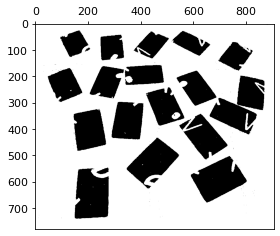

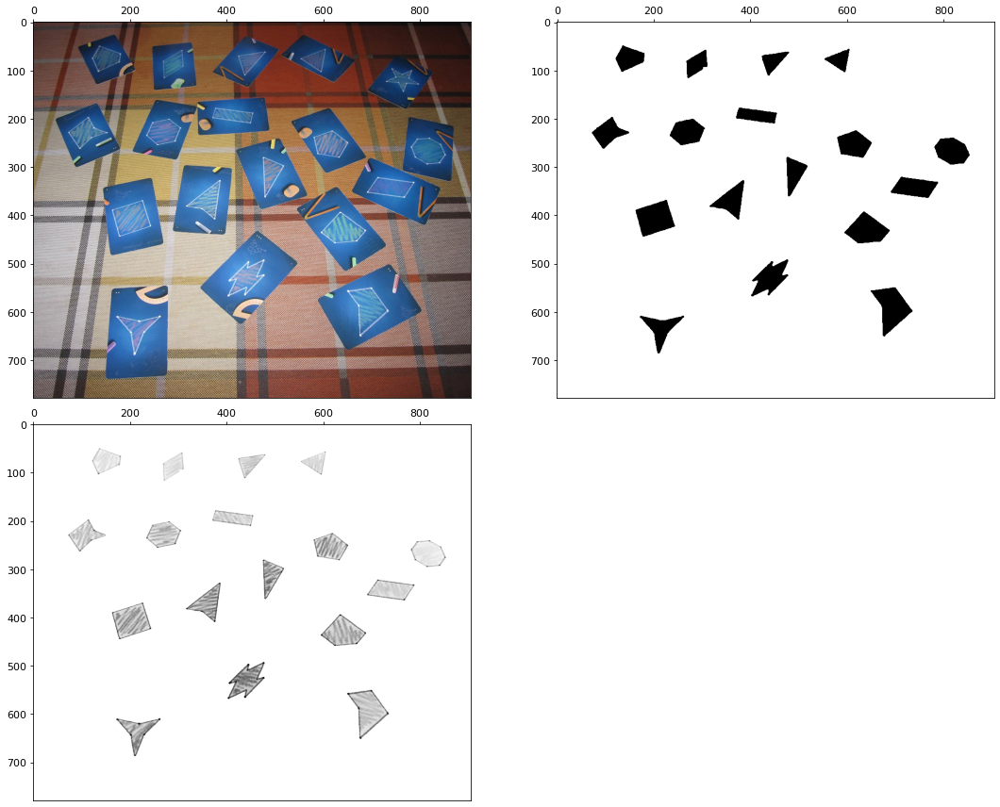

In [1281]:
def solve(img):
    mask = mask_objects(img)
    show_image(mask)
    img = to_1ch(img, mode='s')
    res_1 = img / gaussian(img, sigma=2.5)
    h_ = equalize_hist(res_1)
    res_2 = gaussian(unsharp_mask(gaussian(h_, sigma=1.0), radius=25, amount=3), sigma=1.0)
    res_3 = invert(to_bin(res_2))
    d_ = res_3 * binary_erosion(binary_closing(mask, disk(1)), disk(4))

    s_ = binary_fill_holes(binary_closing(d_, square(2)), disk(1))
    a_ = remove_small_objects(s_, 1200, connectivity=2)
    a_ = binary_fill_holes(binary_closing(a_, square(3)), disk(1))
    a_ = binary_opening(a_, square(3))
    a_ = remove_small_objects(a_, 1200, connectivity=2)
    a_ = binary_fill_holes(binary_closing(a_, square(4)), disk(1))
    b_ = a_

    mask_ = binary_opening(a_, diamond(5))
    mask_ = remove_small_objects(mask_, 1100, connectivity=2)
    mask_ = binary_dilation(mask_, square(12))

    a_ = a_ * mask_
    a_ = binary_opening(a_, disk(1))
    return a_

for i in [6]:
    img = src_images[i]
    solve_ = solve(img)
    show_images([img, solve_, to_1ch(img, mode='r') * solve_], n_in_row=2, factor_r=6, factor_c=8)

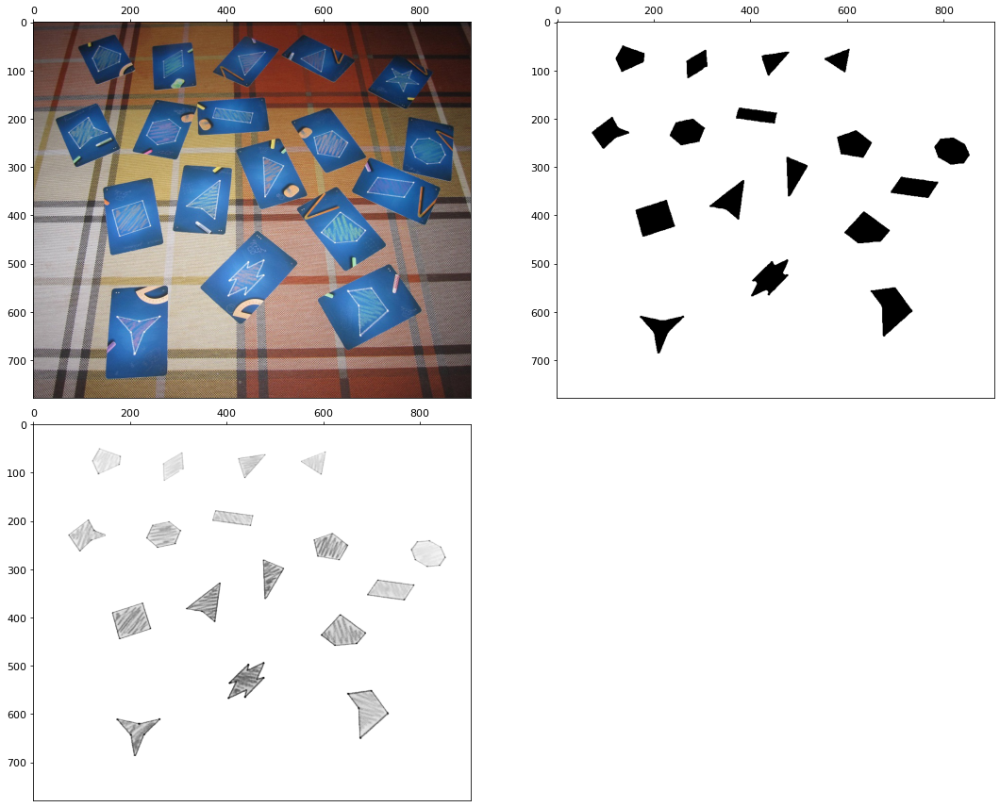

In [1303]:
def solve(img):
    mask = mask_objects(img)
    img = to_1ch(img, mode='s')
    res_1 = img / gaussian(img, sigma=2.5)
    h_ = equalize_hist(res_1)
    res_2 = gaussian(unsharp_mask(gaussian(h_, sigma=1.0), radius=25, amount=3), sigma=1.0)
    res_3 = invert(to_bin(res_2))
    d_ = res_3 * binary_erosion(binary_closing(mask, disk(1)), disk(4))

    s_ = binary_fill_holes(binary_closing(d_, square(2)), disk(1))
    a_ = remove_small_objects(s_, 1200, connectivity=2)
    a_ = binary_fill_holes(binary_closing(a_, square(3)), disk(1))
    a_ = binary_opening(a_, square(3))
    a_ = remove_small_objects(a_, 1200, connectivity=2)
    a_ = binary_fill_holes(binary_closing(a_, square(4)), disk(1))
    b_ = a_

    mask_ = binary_opening(a_, diamond(5))
    mask_ = remove_small_objects(mask_, 1100, connectivity=2)
    mask_ = binary_dilation(mask_, square(12))

    a_ = a_ * mask_
#     a_ = binary_opening(a_, disk(1))
    a_ = binary_erosion(a_, square(1))
    return a_

for i in [6]:
    img = src_images[i]
    solve_ = solve(img)
    show_images([img, binary_closing(solve_, disk(4)), to_1ch(img, mode='r') * solve_], n_in_row=2, factor_r=6, factor_c=8)

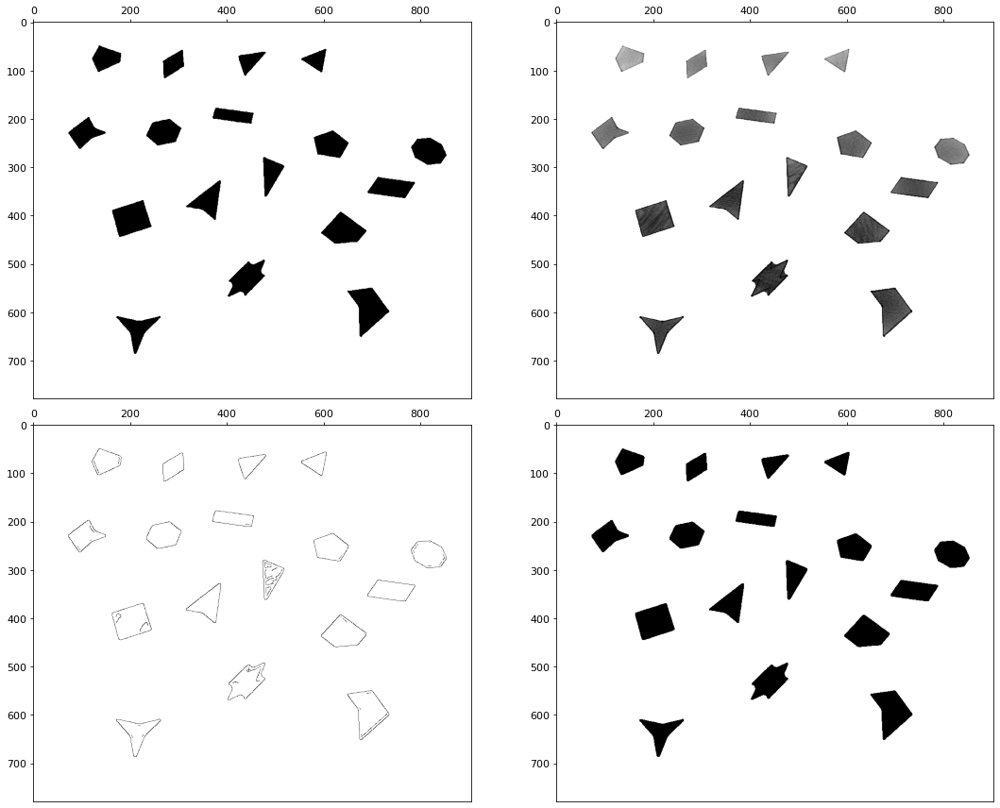

In [1109]:
x = binary_closing(solve_, disk(8))
y = to_1ch(img, mode='v') * x
z = canny(y, sigma=1.5)
show_images([x, y, z, binary_fill_holes(z, disk(1))], n_in_row=2, factor_r=6, factor_c=8)

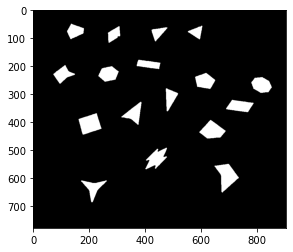

In [1146]:
plt.imshow(s)

In [1125]:
s = solve(img)

In [1130]:
s[s == False] = 0


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

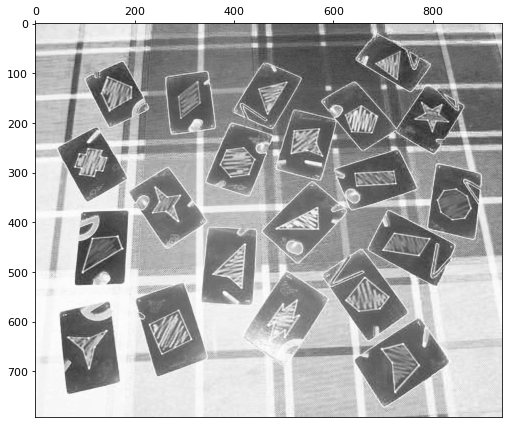

In [891]:
show_images([to_1ch(src_images[5], mode='s')], n_in_row=2, factor_r=6, factor_c=8)

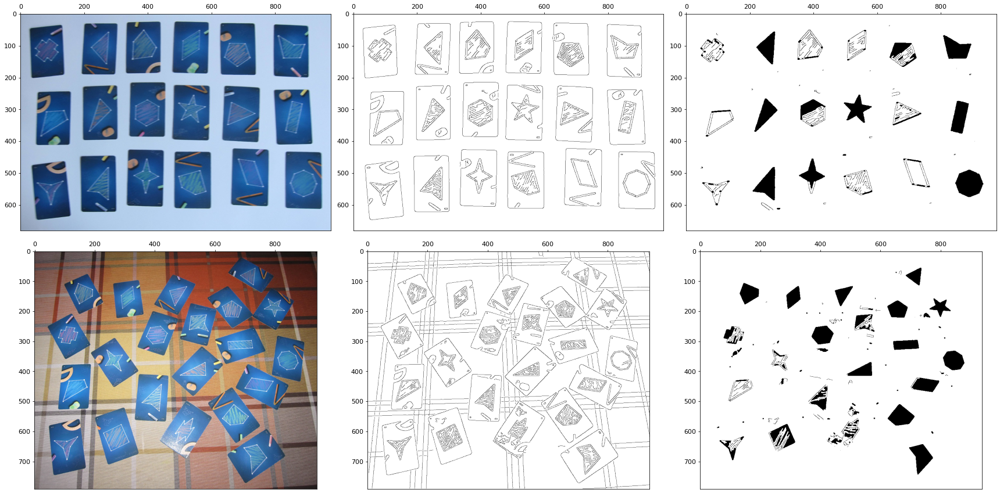

In [463]:
ans = []
for i, j in zip([1, 2, 4, 6, 7, 9, 10], [4, 5]):
    img = src_images[j]
    res = mask_objects(img)
    g_ = rescale_intensity(to_1ch(img, mode='r'), in_range=(0, 195))
    t_ = canny(g_, sigma=1.5)
    b_1 = t_ * binary_erosion(res, disk(3))
    b_2 = binary_fill_holes(binary_closing(b_1, disk(1)), disk(1))
#     ans += [g_, t_, b_1, b_2, unsharp_mask(b_2, radius=20, amount=3)]
    ans += [img, t_, b_2]
    
show_images(ans, n_in_row=3, factor_r=6, factor_c=8)

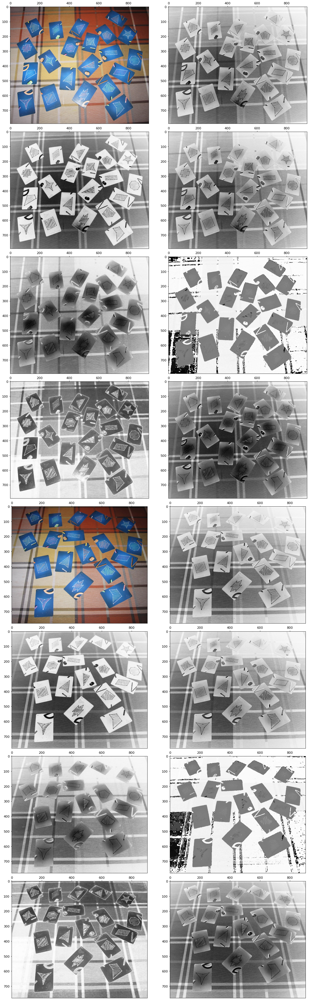

In [171]:
arr_ = []
for i in [5, 6]:
    img = src_images[i]
    arr_.append(img)
    for mode in ['gray', 'r', 'g', 'b', 'h', 's', 'v']:
        arr_.append(to_1ch(img, mode=mode))
show_images(arr_, n_in_row=2, factor_r=6, factor_c=8)

<Figure size 288x288 with 0 Axes>

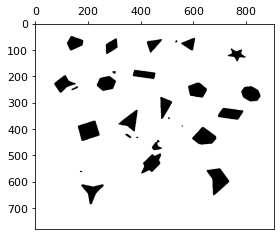

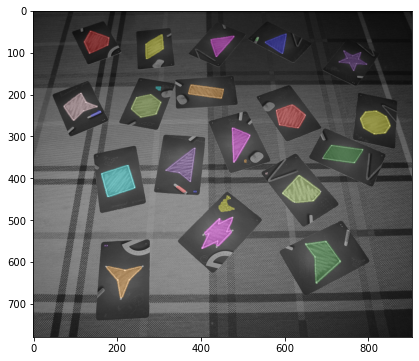

In [153]:
b_ = ans[1]
show_image(b_2)

label_image = label(b_2)

# and leave `bg_color` as `None` and `kind` as `overlay`
image_label_overlay = label2rgb(label_image, image=src_images[6], bg_label=0)

fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(image_label_overlay)

# for region in regionprops(label_image):
    # take regions with large enough areas
#     if region.area >= 100:
        
        # draw rectangle around segmented coins
#         minr, minc, maxr, maxc = region.bbox
#         rect = mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr,
#                                   fill=False, edgecolor='red', linewidth=2)
#         ax.add_patch(rect)
#         ax.imshow(region)